In [1]:
!git clone https://github.com/facebookresearch/co-tracker
%cd co-tracker
!pip install -e .
!pip install opencv-python matplotlib moviepy flow_vis numpy ipympl
%matplotlib widget
!mkdir checkpoints
%cd checkpoints
!wget https://huggingface.co/facebook/cotracker3/resolve/main/scaled_offline.pth

fatal: destination path 'co-tracker' already exists and is not an empty directory.
/home/jovyan/workspace/co-tracker
Obtaining file:///home/jovyan/workspace/co-tracker
  Preparing metadata (setup.py) ... done
  DEPRECATION: Legacy editable install of cotracker==3.0 from file:///home/jovyan/workspace/co-tracker (setup.py develop) is deprecated. pip 25.0 will enforce this behaviour change. A possible replacement is to add a pyproject.toml or enable --use-pep517, and use setuptools >= 64. If the resulting installation is not behaving as expected, try using --config-settings editable_mode=compat. Please consult the setuptools documentation for more information. Discussion can be found at https://github.com/pypa/pip/issues/11457
  Running setup.py develop for cotracker
  Using cached opencv_python-4.10.0.84-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (20 kB)
  Using cached moviepy-2.1.2-py3-none-any.whl.metadata (6.9 kB)
  Using cached flow_vis-0.1-py3-none-any.whl.met

In [2]:
!pip uninstall torchvision --yes
!pip install torchvision

  Using cached torchvision-0.20.1-cp311-cp311-manylinux1_x86_64.whl.metadata (6.1 kB)
  Using cached torch-2.5.1-cp311-cp311-manylinux1_x86_64.whl.metadata (28 kB)
  Using cached networkx-3.4.2-py3-none-any.whl.metadata (6.3 kB)
  Using cached nvidia_cuda_nvrtc_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.4.127-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-9.1.0.70-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.4.5.8-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.2.1.3-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.5.147-py3-none-manylinux2014_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.6.1.9-py3-none-manylinux2014_x86_64.whl.metadata (1.6

In [3]:
%cd ..

import os
import torch
import torchvision
print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
import matplotlib 

from matplotlib import pyplot as plt
from base64 import b64encode
from cotracker.utils.visualizer import Visualizer, read_video_from_path
from IPython.display import HTML

/home/jovyan/workspace/co-tracker
PyTorch version: 2.5.1+cu124
Torchvision version: 0.20.1+cu124


In [4]:
video = read_video_from_path("../sample_asset/rubics_cube.mp4")
video = torch.from_numpy(video).permute(0, 3, 1, 2)[None].float()


In [5]:
def display_video(path):
  vid_file = open(path, "r+b").read()
  vid_url = f"data:video/mp4;base64,{b64encode(vid_file).decode()}"
  return HTML(f""""<video width="640" height="480" autoplay loop controls><source src="{vid_url}"></video>""")

display_video("/home/jovyan/workspace/sample_asset/rubics_cube.mp4")

In [6]:
from cotracker.predictor import CoTrackerPredictor

co_tracker_dir = os.path.abspath(os.path.join(os.getcwd()))
checkpoint_path = os.path.join(co_tracker_dir,'checkpoints/scaled_offline.pth')

model = CoTrackerPredictor(
    checkpoint=checkpoint_path
)

/home/jovyan/workspace/co-tracker/cotracker/models/build_cotracker.py:41: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f, map_location="cpu")


In [8]:
if torch.cpu.is_available():
    model = model.cpu()
    video = video.cpu()

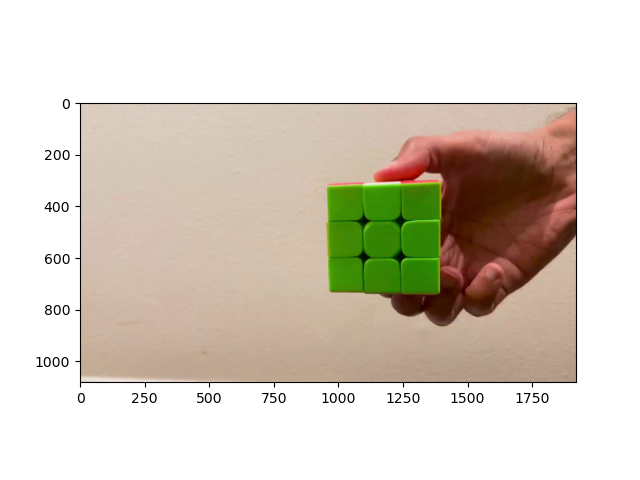

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
video_path = "../sample_asset/rubics_cube.mp4"
cap = cv2.VideoCapture(video_path)

ret,frame = cap.read()
cap.release()

frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)
cv2.imwrite("../sample_asset/frame.jpg",frame)
plt.imshow(frame)
plt.show()

In [10]:
points_selected = []

def get_input(prompt):
    return __builtins__.input(prompt)

print("For best results, enter x,y format")
print("And order (UL, UR, BR, BL)")
for i in range(4):

    usr_pt = input(f"Enter {i+1} (x,y) format: ")

    try: 
        x, y = map(int, usr_pt.split(','))

        points_selected.append((x,y))
    except ValueError:
        print("Invalid input.")
        break

print(points_selected)

For best results, enter x,y format
And order (UL, UR, BR, BL)


Enter 1 (x,y) format:  972,336
Enter 2 (x,y) format:  1379,326
Enter 3 (x,y) format:  1377,722
Enter 4 (x,y) format:  973,720


[(972, 336), (1379, 326), (1377, 722), (973, 720)]


In [11]:
queries = torch.tensor([
    [0., float(points_selected[0][0]),float(points_selected[0][1])],
    [0., float(points_selected[1][0]),float(points_selected[1][1])],
    [0., float(points_selected[2][0]),float(points_selected[2][1])],
    [0., float(points_selected[3][0]),float(points_selected[3][1])]
])

if torch.cuda.is_available():
    queries = queries.cuda()

In [12]:
pred_tracks, pred_visibility = model(video, queries=queries[None])

In [13]:
vis = Visualizer(
    save_dir='../sample_asset',
    linewidth=6,
    mode='cool',
    tracks_leave_trace=-1
)
vis.visualize(
    video=video,
    tracks=pred_tracks,
    visibility=pred_visibility,
    filename='queries');

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1920, 1080) to (1920, 1088) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


Video saved to /home/jovyan/workspace/sample_asset/queries.mp4


In [13]:
display_video("../sample_asset/queries.mp4")

In [14]:
def compute_homography(frame, points):
    """Compute homography to warp selected rectangle to a fixed size."""
    # destination points for the warped image (200x200)
    dest_points = np.array([[0, 0], [200, 0], [200, 200], [0, 200]], dtype=np.float32)
    # homography computation
    h_matrix, _ = cv2.findHomography(np.array(points, dtype=np.float32), dest_points)
    # warp computation
    warped = cv2.warpPerspective(frame, h_matrix, (200, 200))
    return warped

In [23]:
import time

cap = cv2.VideoCapture("../sample_asset/rubics_cube.mp4")

# check if the video opened successfully
if not cap.isOpened():
    print("Error opening video file")

frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS)

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
output_video = cv2.VideoWriter('../sample_asset/homography_video.mp4', 
                               fourcc, fps, (frame_width * 2, frame_height))
i = 0
while cap.isOpened():
    frame_st_time = time.time()
    ret, fr = cap.read()

    #general structure: pred_trakcs [track point num, frame num, x (0), y (1)] 

    #we want to loop through, get our four points and check if the frame was successfully read
    if not ret:
        break
    
    for j in range(4):

        start_point = (int(pred_tracks[0, i, j, 0].item()), int(pred_tracks[0, i, j, 1].item()))
        end_point = (int(pred_tracks[0, i, (j + 1) % 4, 0].item()), int(pred_tracks[0, i, (j + 1) % 4, 1].item()))
        cv2.line(fr, start_point, end_point, (0, 255, 0), 2)
    # creating a warped window
    warped = compute_homography(fr, pred_tracks[0,i].reshape(-1,2))
    warped_resized = cv2.resize(warped, (frame_width, frame_height))
    
    # concatenate the original frame and the warped homography side by side
    combined_frame = np.hstack((fr, warped_resized))

    # write combined frame to output video
        
    fr_rgb = cv2.cvtColor(fr, cv2.COLOR_BGR2RGB)

    # Uncomment if need to display frame by frame
    # plt.imshow(fr_rgb)
    # plt.axis('off')  # Turn off axis
    # plt.show()



    output_video.write(combined_frame)
    i+=1
    
    frame_end_time = time.time()
    print(f"Frame {i} processing time: {frame_end_time - frame_st_time:.4f} seconds") 
# release the video capture object
cap.release()
output_video.release()
# close all OpenCV windows
cv2.destroyAllWindows()

Frame 1 processing time: 0.0436 seconds
Frame 2 processing time: 0.0345 seconds
Frame 3 processing time: 0.0324 seconds
Frame 4 processing time: 0.0316 seconds
Frame 5 processing time: 0.0318 seconds
Frame 6 processing time: 0.0333 seconds
Frame 7 processing time: 0.0321 seconds
Frame 8 processing time: 0.0333 seconds
Frame 9 processing time: 0.0318 seconds
Frame 10 processing time: 0.0329 seconds
Frame 11 processing time: 0.0322 seconds
Frame 12 processing time: 0.0322 seconds
Frame 13 processing time: 0.0307 seconds
Frame 14 processing time: 0.0363 seconds
Frame 15 processing time: 0.0338 seconds
Frame 16 processing time: 0.0335 seconds
Frame 17 processing time: 0.0320 seconds
Frame 18 processing time: 0.0322 seconds
Frame 19 processing time: 0.0321 seconds
Frame 20 processing time: 0.0323 seconds
Frame 21 processing time: 0.0388 seconds
Frame 22 processing time: 0.0364 seconds
Frame 23 processing time: 0.0336 seconds
Frame 24 processing time: 0.0321 seconds
Frame 25 processing time: